In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt

import seaborn as sns
from copy import deepcopy

import itertools
from collections.abc import Iterable

import traceback

sns.set_style("darkgrid")

pd.set_option('max_columns', None)

import warnings

warnings.filterwarnings('ignore')

In [2]:
def flatten_list(l):
    
    def flatten(l):
        for el in l:
            if isinstance(el, Iterable) and not isinstance(el, (str, bytes)):
                yield from flatten(el)
            else:
                yield el
                
    flat_l = flatten(l)
    
    return list(flat_l)

In [3]:
def get_relevant_columns_by_config(config, dataframe):
    try:
        if config['i_net_nas'] == False:
            config.pop('i_net_nas_trials')
    except:
        pass
    
    for key, value in config.items():
        try:
            if isinstance(value, list):
                if isinstance(value[0], str):
                    dataframe_string_query = key + ' == "' + str(value[0]) + '"'
                    for dataframe_string in value[1:]:
                        dataframe_string_query += ' | ' + key + ' == "' + str(dataframe_string) + '"'

                    dataframe = dataframe.query(dataframe_string_query)
                else:
                    dataframe = dataframe[dataframe[key].isin(value)]
                    
            else:
                dataframe = dataframe[dataframe[key] == value]
        except:
            traceback.print_exc()
        
    return dataframe


In [4]:
def plot_results(data_reduced, col, x, y, hue, plot_type=sns.barplot, aspect=1.5, col_wrap=2):
    
    #sns.set(rc={'figure.figsize':(20,10)})
    
    g = sns.FacetGrid(data_reduced, 
                      col=col,
                      ##hue='scores_type', 
                      #height=5, 
                      col_wrap=col_wrap,
                      aspect=aspect,
                      ##legend_out=False,
                     )    
    indexes = np.unique(data_reduced[hue], return_index=True)[1]
    hue_order = [data_reduced[hue].values[index] for index in sorted(indexes)]
        
    g.map(plot_type, 
          x, 
          y, 
          hue,
          hue_order=hue_order,#np.unique(data_reduced[hue]),
          ##figsize=(20,10),
          palette=sns.color_palette(),#'colorblind'
          #order=data_reduced[order_columnname],
          ##order=np.unique(results_summary_reduced_accuracy_plot["scores_type"]),
         )
    g.add_legend(fontsize=12,
               ncol=3,
               bbox_to_anchor=(0.5, -0.025),
               borderaxespad=0)    
    
    return plt.gcf()

In [5]:
#results_complete = pd.read_csv('./results_complete.csv', delimiter=';')
#results_complete = results_complete[results_complete['i_net_nas'] == True]
#results_complete_columns = list(results_complete.columns)

#results_summary = pd.read_csv('./results_summary-TEST.csv', delimiter=';')
results_summary = pd.read_csv('./results_summary.csv', delimiter=';')
#results_summary = results_summary[results_summary['i_net_nas'] == True]
results_summary_columns = list(results_summary.columns)
results_summary['function_family_decision_sparsity'][results_summary['data_number_of_variables'] == results_summary['function_family_decision_sparsity']] = -1


results_summary.head(5)

,function_family_maximum_depth,function_family_beta,function_family_decision_sparsity,function_family_fully_grown,function_family_dt_type,function_family_basic_function_representation_length,function_family_function_representation_length,data_number_of_variables,data_num_classes,data_categorical_indices,data_use_distribution_list,data_random_parameters_distribution,data_max_distributions_per_class,data_data_generation_filtering,data_fixed_class_probability,data_weighted_data_generation,data_shift_distrib,data_dt_type_train,data_maximum_depth_train,data_decision_sparsity_train,data_function_generation_type,data_distribution_list,data_distribution_list_eval,data_objective,data_x_max,data_x_min,data_x_distrib,data_lambda_dataset_size,data_number_of_generated_datasets,data_noise_injected_level,data_noise_injected_type,data_data_noise,data_distrib_param_max,lambda_net_epochs_lambda,lambda_net_early_stopping_lambda,lambda_net_early_stopping_min_delta_lambda,lambda_net_batch_lambda,lambda_net_dropout_lambda,lambda_net_lambda_network_layers,lambda_net_use_batchnorm_lambda,lambda_net_optimizer_lambda,lambda_net_loss_lambda,lambda_net_number_of_lambda_weights,lambda_net_number_initializations_lambda,lambda_net_number_of_trained_lambda_nets,i_net_dense_layers,i_net_dropout,i_net_hidden_activation,i_net_optimizer,i_net_learning_rate,i_net_separate_weight_bias,i_net_convolution_layers,i_net_lstm_layers,i_net_additional_hidden,i_net_loss,i_net_metrics,i_net_epochs,i_net_early_stopping,i_net_batch_size,i_net_interpretation_dataset_size,i_net_test_size,i_net_evaluate_distribution,i_net_force_evaluate_real_world,i_net_function_representation_type,i_net_normalize_lambda_nets,i_net_optimize_decision_function,i_net_function_value_loss,i_net_data_reshape_version,i_net_nas,i_net_nas_type,i_net_nas_trials,i_net_nas_optimizer,evaluation_number_of_random_evaluations_per_distribution,evaluation_random_evaluation_dataset_size,evaluation_random_evaluation_dataset_distribution,evaluation_per_network_optimization_dataset_size,evaluation_different_eval_data,evaluation_eval_data_description_eval_data_function_generation_type,evaluation_eval_data_description_eval_data_lambda_dataset_size,evaluation_eval_data_description_eval_data_noise_injected_level,evaluation_eval_data_description_eval_data_noise_injected_type,evaluation_eval_data_description_eval_data_number_of_trained_lambda_nets,evaluation_eval_data_description_eval_data_interpretation_dataset_size,computation_load_model,computation_n_jobs,computation_use_gpu,computation_gpu_numbers,computation_RANDOM_SEED,computation_verbosity,train_dt_scores_soft_binary_crossentropy,train_dt_scores_soft_binary_crossentropy_median,train_dt_scores_soft_binary_crossentropy_data_random,train_dt_scores_soft_binary_crossentropy_data_random_median,train_dt_scores_binary_crossentropy,train_dt_scores_binary_crossentropy_median,train_dt_scores_binary_crossentropy_data_random,train_dt_scores_binary_crossentropy_data_random_median,train_dt_scores_accuracy,train_dt_scores_accuracy_median,train_dt_scores_accuracy_data_random,train_dt_scores_accuracy_data_random_median,train_dt_scores_f1_score,train_dt_scores_f1_score_median,train_dt_scores_f1_score_data_random,train_dt_scores_f1_score_data_random_median,train_dt_scores_runtime,train_dt_scores_runtime_median,train_inet_scores_soft_binary_crossentropy,train_inet_scores_soft_binary_crossentropy_median,train_inet_scores_binary_crossentropy,train_inet_scores_binary_crossentropy_median,train_inet_scores_accuracy,train_inet_scores_accuracy_median,train_inet_scores_f1_score,train_inet_scores_f1_score_median,train_inet_scores_runtime,train_inet_scores_runtime_median,valid_dt_scores_soft_binary_crossentropy,valid_dt_scores_soft_binary_crossentropy_median,valid_dt_scores_soft_binary_crossentropy_data_random,valid_dt_scores_soft_binary_crossentropy_data_random_median,valid_dt_scores_binary_crossentropy,valid_dt_scores_binary_crossentropy_median,valid_dt_scores_binary_crossentropy_data_random,va

In [6]:
results_summary.head(5)

,function_family_maximum_depth,function_family_beta,function_family_decision_sparsity,function_family_fully_grown,function_family_dt_type,function_family_basic_function_representation_length,function_family_function_representation_length,data_number_of_variables,data_num_classes,data_categorical_indices,data_use_distribution_list,data_random_parameters_distribution,data_max_distributions_per_class,data_data_generation_filtering,data_fixed_class_probability,data_weighted_data_generation,data_shift_distrib,data_dt_type_train,data_maximum_depth_train,data_decision_sparsity_train,data_function_generation_type,data_distribution_list,data_distribution_list_eval,data_objective,data_x_max,data_x_min,data_x_distrib,data_lambda_dataset_size,data_number_of_generated_datasets,data_noise_injected_level,data_noise_injected_type,data_data_noise,data_distrib_param_max,lambda_net_epochs_lambda,lambda_net_early_stopping_lambda,lambda_net_early_stopping_min_delta_lambda,lambda_net_batch_lambda,lambda_net_dropout_lambda,lambda_net_lambda_network_layers,lambda_net_use_batchnorm_lambda,lambda_net_optimizer_lambda,lambda_net_loss_lambda,lambda_net_number_of_lambda_weights,lambda_net_number_initializations_lambda,lambda_net_number_of_trained_lambda_nets,i_net_dense_layers,i_net_dropout,i_net_hidden_activation,i_net_optimizer,i_net_learning_rate,i_net_separate_weight_bias,i_net_convolution_layers,i_net_lstm_layers,i_net_additional_hidden,i_net_loss,i_net_metrics,i_net_epochs,i_net_early_stopping,i_net_batch_size,i_net_interpretation_dataset_size,i_net_test_size,i_net_evaluate_distribution,i_net_force_evaluate_real_world,i_net_function_representation_type,i_net_normalize_lambda_nets,i_net_optimize_decision_function,i_net_function_value_loss,i_net_data_reshape_version,i_net_nas,i_net_nas_type,i_net_nas_trials,i_net_nas_optimizer,evaluation_number_of_random_evaluations_per_distribution,evaluation_random_evaluation_dataset_size,evaluation_random_evaluation_dataset_distribution,evaluation_per_network_optimization_dataset_size,evaluation_different_eval_data,evaluation_eval_data_description_eval_data_function_generation_type,evaluation_eval_data_description_eval_data_lambda_dataset_size,evaluation_eval_data_description_eval_data_noise_injected_level,evaluation_eval_data_description_eval_data_noise_injected_type,evaluation_eval_data_description_eval_data_number_of_trained_lambda_nets,evaluation_eval_data_description_eval_data_interpretation_dataset_size,computation_load_model,computation_n_jobs,computation_use_gpu,computation_gpu_numbers,computation_RANDOM_SEED,computation_verbosity,train_dt_scores_soft_binary_crossentropy,train_dt_scores_soft_binary_crossentropy_median,train_dt_scores_soft_binary_crossentropy_data_random,train_dt_scores_soft_binary_crossentropy_data_random_median,train_dt_scores_binary_crossentropy,train_dt_scores_binary_crossentropy_median,train_dt_scores_binary_crossentropy_data_random,train_dt_scores_binary_crossentropy_data_random_median,train_dt_scores_accuracy,train_dt_scores_accuracy_median,train_dt_scores_accuracy_data_random,train_dt_scores_accuracy_data_random_median,train_dt_scores_f1_score,train_dt_scores_f1_score_median,train_dt_scores_f1_score_data_random,train_dt_scores_f1_score_data_random_median,train_dt_scores_runtime,train_dt_scores_runtime_median,train_inet_scores_soft_binary_crossentropy,train_inet_scores_soft_binary_crossentropy_median,train_inet_scores_binary_crossentropy,train_inet_scores_binary_crossentropy_median,train_inet_scores_accuracy,train_inet_scores_accuracy_median,train_inet_scores_f1_score,train_inet_scores_f1_score_median,train_inet_scores_runtime,train_inet_scores_runtime_median,valid_dt_scores_soft_binary_crossentropy,valid_dt_scores_soft_binary_crossentropy_median,valid_dt_scores_soft_binary_crossentropy_data_random,valid_dt_scores_soft_binary_crossentropy_data_random_median,valid_dt_scores_binary_crossentropy,valid_dt_scores_binary_crossentropy_median,valid_dt_scores_binary_crossentropy_data_random,va

In [7]:
colmuns_identifier = [
                  'function_family_maximum_depth',
                  'function_family_decision_sparsity', 
                  'function_family_dt_type',
                  'data_dt_type_train',
                  'data_maximum_depth_train',
                  'data_number_of_variables',
                  'data_noise_injected_level',
                  'data_function_generation_type',
                  'data_categorical_indices',
                  'lambda_net_lambda_network_layers',
                  'lambda_net_optimizer_lambda',
                  'i_net_dense_layers',
                  'i_net_dropout',
                  'i_net_learning_rate',
                  'i_net_loss',
                  'i_net_interpretation_dataset_size',
                  'i_net_function_representation_type',
                  'i_net_data_reshape_version',
                  'i_net_nas',
                  'i_net_nas_trials',
                  'evaluation_eval_data_description_eval_data_function_generation_type',
                  'evaluation_eval_data_description_eval_data_noise_injected_level',
                 ]


In [8]:
columns_inet = []
for column in results_summary_columns:
    if 'inet_scores' in column:
        columns_inet.append(column)
results_summary_inet = results_summary[flatten_list([colmuns_identifier, columns_inet])]

results_summary_inet

,function_family_maximum_depth,function_family_decision_sparsity,function_family_dt_type,data_dt_type_train,data_maximum_depth_train,data_number_of_variables,data_noise_injected_level,data_function_generation_type,data_categorical_indices,lambda_net_lambda_network_layers,lambda_net_optimizer_lambda,i_net_dense_layers,i_net_dropout,i_net_learning_rate,i_net_loss,i_net_interpretation_dataset_size,i_net_function_representation_type,i_net_data_reshape_version,i_net_nas,i_net_nas_trials,evaluation_eval_data_description_eval_data_function_generation_type,evaluation_eval_data_description_eval_data_noise_injected_level,train_inet_scores_soft_binary_crossentropy,train_inet_scores_soft_binary_crossentropy_median,train_inet_scores_binary_crossentropy,train_inet_scores_binary_crossentropy_median,train_inet_scores_accuracy,train_inet_scores_accuracy_median,train_inet_scores_f1_score,train_inet_scores_f1_score_median,train_inet_scores_runtime,train_inet_scores_runtime_median,valid_inet_scores_soft_binary_crossentropy,valid_inet_scores_soft_binary_crossentropy_median,valid_inet_scores_binary_crossentropy,valid_inet_scores_binary_crossentropy_median,valid_inet_scores_accuracy,valid_inet_scores_accuracy_median,valid_inet_scores_f1_score,valid_inet_scores_f1_score_median,valid_inet_scores_runtime,valid_inet_scores_runtime_median,test_uniform_inet_scores_soft_binary_crossentropy,test_uniform_inet_scores_soft_binary_crossentropy_median,test_uniform_inet_scores_binary_crossentropy,test_uniform_inet_scores_binary_crossentropy_median,test_uniform_inet_scores_accuracy,test_uniform_inet_scores_accuracy_median,test_uniform_inet_scores_f1_score,test_uniform_inet_scores_f1_score_median,test_uniform_inet_scores_runtime,test_uniform_inet_scores_runtime_median,test_normal_inet_scores_soft_binary_crossentropy,test_normal_inet_scores_soft_binary_crossentropy_median,test_normal_inet_scores_binary_crossentropy,test_normal_inet_scores_binary_crossentropy_median,test_normal_inet_scores_accuracy,test_normal_inet_scores_accuracy_median,test_normal_inet_scores_f1_score,test_normal_inet_scores_f1_score_median,test_normal_inet_scores_runtime,test_normal_inet_scores_runtime_median,test_gamma_inet_scores_soft_binary_crossentropy,test_gamma_inet_scores_soft_binary_crossentropy_median,test_gamma_inet_scores_binary_crossentropy,test_gamma_inet_scores_binary_crossentropy_median,test_gamma_inet_scores_accuracy,test_gamma_inet_scores_accuracy_median,test_gamma_inet_scores_f1_score,test_gamma_inet_scores_f1_score_median,test_gamma_inet_scores_runtime,test_gamma_inet_scores_runtime_median,test_beta_inet_scores_soft_binary_crossentropy,test_beta_inet_scores_soft_binary_crossentropy_median,test_beta_inet_scores_binary_crossentropy,test_beta_inet_scores_binary_crossentropy_median,test_beta_inet_scores_accuracy,test_beta_inet_scores_accuracy_median,test_beta_inet_scores_f1_score,test_beta_inet_scores_f1_score_median,test_beta_inet_scores_runtime,test_beta_inet_scores_runtime_median,test_poisson_inet_scores_soft_binary_crossentropy,test_poisson_inet_scores_soft_binary_crossentropy_median,test_poisson_inet_scores_binary_crossentropy,test_poisson_inet_scores_binary_crossentropy_median,test_poisson_inet_scores_accuracy,test_poisson_inet_scores_accuracy_median,test_poisson_inet_scores_f1_score,test_poisson_inet_scores_f1_score_median,test_poisson_inet_scores_runtime,test_poisson_inet_scores_runtime_median,inet_scores_soft_binary_crossentropy_Adult_10000,inet_scores_binary_crossentropy_Adult_10000,inet_scores_accuracy_Adult_10000,inet_scores_f1_score_Adult_10000,inet_scores_runtime_Adult_10000,inet_scores_soft_binary_crossentropy_Titanic_10000,inet_scores_binary_crossentropy_Titanic_10000,inet_scores_accuracy_Titanic_10000,inet_scores_f1_score_Titanic_10000,inet_scores_runtime_Titanic_10000,inet_scores_soft_binary_crossentropy_Absenteeism_10000,inet_scores_binary_crossentropy_Absenteeism_10000,inet_scores_accuracy_Absenteeism_10000,inet_scores_f1_score_Absenteeism_10000,inet_scores_runti

In [9]:
columns_inet = []
for column in results_summary_columns:
    if 'inet_scores' in column:
        columns_inet.append(column)
results_summary_inet = results_summary[flatten_list([colmuns_identifier, columns_inet])]

columns_inet_rename = []
for column in columns_inet:
    column = column.replace('inet_scores_', '')
    columns_inet_rename.append(column)

results_summary_inet.columns = flatten_list([colmuns_identifier, columns_inet_rename])

#results_summary_inet.insert(0, 'scores_type', 'inet_scores')
results_summary_inet.insert(0, 'dt_type', [dt_type + str(decision_sparsity) for dt_type, decision_sparsity in zip(results_summary_inet['function_family_dt_type'].values, results_summary_inet['function_family_decision_sparsity'].values)])
results_summary_inet.insert(0, 'technique', ['inet' for _ in range(results_summary_inet.shape[0])])

    
print(results_summary_inet.shape)
results_summary_inet.head(20)

(14, 484)


,technique,dt_type,function_family_maximum_depth,function_family_decision_sparsity,function_family_dt_type,data_dt_type_train,data_maximum_depth_train,data_number_of_variables,data_noise_injected_level,data_function_generation_type,data_categorical_indices,lambda_net_lambda_network_layers,lambda_net_optimizer_lambda,i_net_dense_layers,i_net_dropout,i_net_learning_rate,i_net_loss,i_net_interpretation_dataset_size,i_net_function_representation_type,i_net_data_reshape_version,i_net_nas,i_net_nas_trials,evaluation_eval_data_description_eval_data_function_generation_type,evaluation_eval_data_description_eval_data_noise_injected_level,train_soft_binary_crossentropy,train_soft_binary_crossentropy_median,train_binary_crossentropy,train_binary_crossentropy_median,train_accuracy,train_accuracy_median,train_f1_score,train_f1_score_median,train_runtime,train_runtime_median,valid_soft_binary_crossentropy,valid_soft_binary_crossentropy_median,valid_binary_crossentropy,valid_binary_crossentropy_median,valid_accuracy,valid_accuracy_median,valid_f1_score,valid_f1_score_median,valid_runtime,valid_runtime_median,test_uniform_soft_binary_crossentropy,test_uniform_soft_binary_crossentropy_median,test_uniform_binary_crossentropy,test_uniform_binary_crossentropy_median,test_uniform_accuracy,test_uniform_accuracy_median,test_uniform_f1_score,test_uniform_f1_score_median,test_uniform_runtime,test_uniform_runtime_median,test_normal_soft_binary_crossentropy,test_normal_soft_binary_crossentropy_median,test_normal_binary_crossentropy,test_normal_binary_crossentropy_median,test_normal_accuracy,test_normal_accuracy_median,test_normal_f1_score,test_normal_f1_score_median,test_normal_runtime,test_normal_runtime_median,test_gamma_soft_binary_crossentropy,test_gamma_soft_binary_crossentropy_median,test_gamma_binary_crossentropy,test_gamma_binary_crossentropy_median,test_gamma_accuracy,test_gamma_accuracy_median,test_gamma_f1_score,test_gamma_f1_score_median,test_gamma_runtime,test_gamma_runtime_median,test_beta_soft_binary_crossentropy,test_beta_soft_binary_crossentropy_median,test_beta_binary_crossentropy,test_beta_binary_crossentropy_median,test_beta_accuracy,test_beta_accuracy_median,test_beta_f1_score,test_beta_f1_score_median,test_beta_runtime,test_beta_runtime_median,test_poisson_soft_binary_crossentropy,test_poisson_soft_binary_crossentropy_median,test_poisson_binary_crossentropy,test_poisson_binary_crossentropy_median,test_poisson_accuracy,test_poisson_accuracy_median,test_poisson_f1_score,test_poisson_f1_score_median,test_poisson_runtime,test_poisson_runtime_median,soft_binary_crossentropy_Adult_10000,binary_crossentropy_Adult_10000,accuracy_Adult_10000,f1_score_Adult_10000,runtime_Adult_10000,soft_binary_crossentropy_Titanic_10000,binary_crossentropy_Titanic_10000,accuracy_Titanic_10000,f1_score_Titanic_10000,runtime_Titanic_10000,soft_binary_crossentropy_Absenteeism_10000,binary_crossentropy_Absenteeism_10000,accuracy_Absenteeism_10000,f1_score_Absenteeism_10000,runtime_Absenteeism_10000,soft_binary_crossentropy_Loan House_10000,binary_crossentropy_Loan House_10000,accuracy_Loan House_10000,f1_score_Loan House_10000,runtime_Loan House_10000,soft_binary_crossentropy_Loan Credit_10000,binary_crossentropy_Loan Credit_10000,accuracy_Loan Credit_10000,f1_score_Loan Credit_10000,runtime_Loan Credit_10000,soft_binary_crossentropy_Medical Insurance_10000,binary_crossentropy_Medical Insurance_10000,accuracy_Medical Insurance_10000,f1_score_Medical Insurance_10000,runtime_Medical Insurance_10000,soft_binary_crossentropy_Bank Marketing_10000,binary_crossentropy_Bank Marketing_10000,accuracy_Bank Marketing_10000,f1_score_Bank Marketing_10000,runtime_Bank Marketing_10000,soft_binary_crossentropy_Cervical Cancer_10000,binary_crossentropy_Cervical Cancer_10000,accuracy_Cervical Cancer_10000,f1_score_Cervical Cancer_10000,runtime_Cervical Cancer_10000,soft_binary_crossentropy_Brest Cancer Wisconsin_10000,binary_crossentropy_Brest Cancer Wisconsin_10000,accuracy_Bres

In [10]:
columns_dt_distilled = []
for column in results_summary_columns:
    if 'dt_scores' in column:
        if 'data_random' not in column:
            columns_dt_distilled.append(column)
results_summary_dt_distilled = results_summary[flatten_list([colmuns_identifier, columns_dt_distilled])]

columns_dt_distilled_rename = []
for column in columns_dt_distilled:
    column = column.replace('dt_scores_','')
    columns_dt_distilled_rename.append(column)

results_summary_dt_distilled.columns = flatten_list([colmuns_identifier, columns_dt_distilled_rename])
    
#results_summary_dt_distilled.insert(0, 'scores_type', 'dt_scores')
results_summary_dt_distilled.insert(0, 'dt_type', [dt_type + str(decision_sparsity) for dt_type, decision_sparsity in zip(results_summary_dt_distilled['function_family_dt_type'].values, results_summary_dt_distilled['function_family_decision_sparsity'].values)])
results_summary_dt_distilled.insert(0, 'technique', ['distilled' for _ in range(results_summary_dt_distilled.shape[0])])

    
print(results_summary_dt_distilled.shape)
results_summary_dt_distilled.head(15)


(14, 2786)


technique   dt_type  function_family_maximum_depth  \
0   distilled  vanilla1                              3   
1   distilled  vanilla1                              3   
2   distilled  vanilla1                              3   
3   distilled     SDT-1                              3   
4   distilled  vanilla1                              3   
5   distilled     SDT-1                              3   
6   distilled  vanilla1                              3   
7   distilled     SDT-1                              3   
8   distilled     SDT-1                              3   
9   distilled  vanilla1                              3   
10  distilled  vanilla1                              3   
11  distilled     SDT-1                              3   
12  distilled     SDT-1                              3   
13  distilled     SDT-1                              3   

    function_family_decision_sparsity function_family_dt_type  \
0                                   1                 vanilla   
1                                   1                 vanilla   
2                                   1                 vanilla   
3                                  -1                     SDT   
4                                   1                 vanilla   
5                                  -1                     SDT   
6                                   1                 vanilla   
7                                  -1                     SDT   
8                                  -1                     SDT   
9                                   1                 vanilla   
10                                  1                 vanilla   
11                                 -1                     SDT   
12                                 -1                     SDT   
13                                 -1                     SDT   

   data_dt_type_train  data_maximum_depth_train  data_number_of_variables  \
0             vanilla                         4                        32   
1             vanilla                         4                        16   
2             vanilla                         4                        28   
3             vanilla                         4                        16   
4             vanilla                         4                        15   
5             vanilla                         4                        28   
6             vanilla                         4                        29   
7             vanilla                         4                        29   
8             vanilla                         4                        32   
9             vanilla                         4                        10   
10            vanilla                         4                         9   
11            vanilla                         4                        15   
12            vanilla                         4                         9   
13            vanilla                         4                        10   

    data_noise_injected_level data_function_generation_type  \
0                           0                  distribution   
1                           0                  distribution   
2                           0                  distribution   
3                           0                  distribution   
4                           0                  distribution   
5                           0                  distribution   
6                           0                  distribution   
7                           0                  distribution   
8                           0                  distribution   
9                           0                  distribution   
10                          0                  distribution   
11                          0                  distribution   
12                          0                  distribution   
13                          0                  distribution   

   data_categorical_indices lambda_net_lambda_network_l

In [11]:
results_summary_reduced = pd.concat([
                                     results_summary_inet, 
                                     results_summary_dt_distilled, 
                                    ]).reset_index(drop=True)
results_summary_reduced_columns = results_summary_reduced.columns
results_summary_reduced.head(5)

technique   dt_type  function_family_maximum_depth  \
0      inet  vanilla1                              3   
1      inet  vanilla1                              3   
2      inet  vanilla1                              3   
3      inet     SDT-1                              3   
4      inet  vanilla1                              3   

   function_family_decision_sparsity function_family_dt_type  \
0                                  1                 vanilla   
1                                  1                 vanilla   
2                                  1                 vanilla   
3                                 -1                     SDT   
4                                  1                 vanilla   

  data_dt_type_train  data_maximum_depth_train  data_number_of_variables  \
0            vanilla                         4                        32   
1            vanilla                         4                        16   
2            vanilla                         4                        28   
3            vanilla                         4                        16   
4            vanilla                         4                        15   

   data_noise_injected_level data_function_generation_type  \
0                          0                  distribution   
1                          0                  distribution   
2                          0                  distribution   
3                          0                  distribution   
4                          0                  distribution   

  data_categorical_indices lambda_net_lambda_network_layers  \
0                       []                            [128]   
1                       []                            [128]   
2                       []                            [128]   
3                       []                            [128]   
4                       []                            [128]   

  lambda_net_optimizer_lambda i_net_dense_layers i_net_dropout  \
0                        adam   [1792, 512, 512]   [0, 0, 0.5]   
1                        adam   [1792, 512, 512]   [0, 0, 0.5]   
2                        adam   [1792, 512, 512]   [0, 0, 0.5]   
3                        adam   [1792, 512, 512]   [0, 0, 0.5]   
4                        adam   [1792, 512, 512]   [0, 0, 0.5]   

   i_net_learning_rate           i_net_loss  \
0                0.001  binary_crossentropy   
1                0.001  binary_crossentropy   
2                0.001  binary_crossentropy   
3                0.001  binary_crossentropy   
4                0.001  binary_crossentropy   

   i_net_interpretation_dataset_size  i_net_function_representation_type  \
0                              10000                                   3   
1                              10000                                   3   
2                              10000                                   3   
3                              10000                                   1   
4                              10000                                   3   

  i_net_data_reshape_version  i_net_nas  i_net_nas_trials  \
0                       None      False                60   
1                       None      False                60   
2                       None      False                60   
3                       None      False                60   
4                       None      False                60   

  evaluation_eval_data_description_eval_data_function_generation_type  \
0                                make_classification                    
1                                make_classification                    
2                                make_classification                    
3                                make_classification                    
4                                make_classification                    

   evaluation_eval_data_description_eval_data_noise_injected_level  \
0                                                  0      

In [12]:
config = {
    'i_net_dense_layers': ['[1792, 512, 512]'],#['[1024, 1024, 256, 2048, 2048]'],#
    'i_net_loss': 'binary_crossentropy', # 'binary_crossentropy', 'soft_binary_crossentropy'

    #'data_noise_injected_level': 0.2, #0, 0.2
    #'data_data_noise': 0.1,

    'i_net_nas': False, # 'True', 'False'
    'i_net_nas_trials': 20, #20, 100

    #'data_number_of_variables': [unique_value], # [10]
    'function_family_maximum_depth': [3, 4, 5], # [3, 4, 5]
}

In [13]:
score_names_list = ['valid_accuracy', 'valid_binary_crossentropy', 'valid_f1_score']
valid_scores_columns = [name for name in results_summary_reduced_columns if 'valid' in name and any([score in name for score in score_names_list])]
valid_identifier_columns = ['dt_type', 'data_number_of_variables', 'technique']
valid_columns = flatten_list([valid_identifier_columns, valid_scores_columns])

valid_scores_df = get_relevant_columns_by_config(config, results_summary_reduced)
valid_scores_df = valid_scores_df[valid_columns]
valid_scores_df = valid_scores_df.sort_values(['dt_type', 'data_number_of_variables', 'technique'], ascending=[True, True, True])
valid_scores_df.head(20)


,dt_type,data_number_of_variables,technique,valid_binary_crossentropy,valid_binary_crossentropy_median,valid_accuracy,valid_accuracy_median,valid_f1_score,valid_f1_score_median
26,SDT-1,9,distilled,0.460930,0.236078,0.82888,0.9368,0.694853,0.936146
12,SDT-1,9,inet,0.126086,0.098413,0.96112,0.9736,0.963269,0.974142
27,SDT-1,10,distilled,0.479486,0.153839,0.85200,0.9668,0.773796,0.966476
13,SDT-1,10,inet,0.115294,0.069300,0.96560,0.9824,0.967639,0.982455
25,SDT-1,15,distilled,0.224256,0.017801,0.94576,0.9988,0.896025,0.998807
11,SDT-1,15,inet,0.042049,0.032409,0.98928,0.9924,0.989255,0.992384
17,SDT-1,16,distilled,0.165619,0.021275,0.94856,0.9984,0.898719,0.998413
3,SDT-1,16,inet,0.086335,0.038501,0.97576,0.9916,0.977396,0.991606
19,SDT-1,28,distilled,0.020176,0.013344,0.99984,1.0000,0.999840,1.000000
5,SDT-1,28,inet,0.014867,0.010320,0.99728,0.9984,0.997253,0.998400


In [14]:
if True:
    real_world_datasets = {
                            'Adult': 28,#65,
                            'Titanic': 9,
                            'Absenteeism': 15,
                            'Loan House': 16,#17,
                            'Loan Credit': 32,
                            'Medical Insurance': 9,#6,
                            'Bank Marketing': 29,#17,
                            'Cervical Cancer': 15,
                            'Brest Cancer Wisconsin': 9,
                            'Wisconsin Diagnostic Breast Cancer': 10,
                            'Wisconsin Prognostic Breast Cancer': 10,
                            'Abalone': 10,
                            #'Car': 21,
                           }
    real_world_datasets = dict(sorted(real_world_datasets.items(), key=lambda item: item[1]))
else:
    real_world_datasets = {
                            #'Adult': 28,#65,
                            'Titanic': 9,
                            'Absenteeism': 15,
                            'Loan House': 16,#17,
                            #'Loan Credit': 32,
                            'Medical Insurance': 9,#6,
                            'Bank Marketing': 29,#17,
                            #'Cervical Cancer': 15,
                            #'Brest Cancer Wisconsin': 9,
                            'Wisconsin Diagnostic Breast Cancer': 10,
                            #'Wisconsin Prognostic Breast Cancer': 10,
                            #'Abalone': 10,
                            #'Car': 21,
                           }
    real_world_datasets = dict(sorted(real_world_datasets.items(), key=lambda item: item[1]))

In [15]:
real_world_dataset_names = list(real_world_datasets.keys())
score_names_list = ['accuracy']#['accuracy', 'binary_crossentropy', 'f1_score']
real_world_scores_columns = [name for name in results_summary_reduced_columns if any([score in name for score in score_names_list]) and 'soft' not in name and any([dataset_name in name for dataset_name in real_world_dataset_names])]
real_world_identifier_columns = ['dt_type', 'data_number_of_variables', 'technique']
real_world_columns = flatten_list([real_world_identifier_columns, real_world_scores_columns])

real_world_scores_df = get_relevant_columns_by_config(config, results_summary_reduced)
real_world_scores_df = real_world_scores_df[real_world_columns]
real_world_scores_df = real_world_scores_df.sort_values(['dt_type', 'data_number_of_variables', 'technique'], ascending=[True, True, True])
real_world_scores_df.head(20)


,dt_type,data_number_of_variables,technique,accuracy_Adult_10000,accuracy_Titanic_10000,accuracy_Absenteeism_10000,accuracy_Loan House_10000,accuracy_Loan Credit_10000,accuracy_Medical Insurance_10000,accuracy_Bank Marketing_10000,accuracy_Cervical Cancer_10000,accuracy_Brest Cancer Wisconsin_10000,accuracy_Wisconsin Diagnostic Breast Cancer_10000,accuracy_Wisconsin Prognostic Breast Cancer_10000,accuracy_Abalone_10000,accuracy_Adult_10000.1,accuracy_Titanic_10000.1,accuracy_Absenteeism_10000.1,accuracy_Loan House_10000.1,accuracy_Loan Credit_10000.1,accuracy_Medical Insurance_10000.1,accuracy_Bank Marketing_10000.1,accuracy_Cervical Cancer_10000.1,accuracy_Brest Cancer Wisconsin_10000.1,accuracy_Wisconsin Diagnostic Breast Cancer_10000.1,accuracy_Wisconsin Prognostic Breast Cancer_10000.1,accuracy_Abalone_10000.1,accuracy_Adult_10000.2,accuracy_Titanic_10000.2,accuracy_Absenteeism_10000.2,accuracy_Loan House_10000.2,accuracy_Loan Credit_10000.2,accuracy_Medical Insurance_10000.2,accuracy_Bank Marketing_10000.2,accuracy_Cervical Cancer_10000.2,accuracy_Brest Cancer Wisconsin_10000.2,accuracy_Wisconsin Diagnostic Breast Cancer_10000.2,accuracy_Wisconsin Prognostic Breast Cancer_10000.2,accuracy_Abalone_10000.2,accuracy_Adult_10000.3,accuracy_Titanic_10000.3,accuracy_Absenteeism_10000.3,accuracy_Loan House_10000.3,accuracy_Loan Credit_10000.3,accuracy_Medical Insurance_10000.3,accuracy_Bank Marketing_10000.3,accuracy_Cervical Cancer_10000.3,accuracy_Brest Cancer Wisconsin_10000.3,accuracy_Wisconsin Diagnostic Breast Cancer_10000.3,accuracy_Wisconsin Prognostic Breast Cancer_10000.3,accuracy_Abalone_10000.3,accuracy_Adult_10000.4,accuracy_Titanic_10000.4,accuracy_Absenteeism_10000.4,accuracy_Loan House_10000.4,accuracy_Loan Credit_10000.4,accuracy_Medical Insurance_10000.4,accuracy_Bank Marketing_10000.4,accuracy_Cervical Cancer_10000.4,accuracy_Brest Cancer Wisconsin_10000.4,accuracy_Wisconsin Diagnostic Breast Cancer_10000.4,accuracy_Wisconsin Prognostic Breast Cancer_10000.4,accuracy_Abalone_10000.4,accuracy_Adult_TRAIN_DATA,accuracy_Titanic_TRAIN_DATA,accuracy_Absenteeism_TRAIN_DATA,accuracy_Loan House_TRAIN_DATA,accuracy_Loan Credit_TRAIN_DATA,accuracy_Medical Insurance_TRAIN_DATA,accuracy_Bank Marketing_TRAIN_DATA,accuracy_Cervical Cancer_TRAIN_DATA,accuracy_Brest Cancer Wisconsin_TRAIN_DATA,accuracy_Wisconsin Diagnostic Breast Cancer_TRAIN_DATA,accuracy_Wisconsin Prognostic Breast Cancer_TRAIN_DATA,accuracy_Abalone_TRAIN_DATA,accuracy_uniform_Adult_10000,accuracy_normal_Adult_10000,accuracy_gamma_Adult_10000,accuracy_beta_Adult_10000,accuracy_poisson_Adult_10000,accuracy_std_Adult_10000,accuracy_uniform_Titanic_10000,accuracy_normal_Titanic_10000,accuracy_gamma_Titanic_10000,accuracy_beta_Titanic_10000,accuracy_poisson_Titanic_10000,accuracy_std_Titanic_10000,accuracy_uniform_Absenteeism_10000,accuracy_normal_Absenteeism_10000,accuracy_gamma_Absenteeism_10000,accuracy_beta_Absenteeism_10000,accuracy_poisson_Absenteeism_10000,accuracy_std_Absenteeism_10000,accuracy_uniform_Loan House_10000,accuracy_normal_Loan House_10000,accuracy_gamma_Loan House_10000,accuracy_beta_Loan House_10000,accuracy_poisson_Loan House_10000,accuracy_std_Loan House_10000,accuracy_uniform_Loan Credit_10000,accuracy_normal_Loan Credit_10000,accuracy_gamma_Loan Credit_10000,accuracy_beta_Loan Credit_10000,accuracy_poisson_Loan Credit_10000,accuracy_std_Loan Credit_10000,accuracy_uniform_Medical Insurance_10000,accuracy_normal_Medical Insurance_10000,accuracy_gamma_Medical Insurance_10000,accuracy_beta_Medical Insurance_10000,accuracy_poisson_Medical Insurance_10000,accuracy_std_Medical Insurance_10000,accuracy_uniform_Bank Marketing_10000,accuracy_normal_Bank Marketing_10000,accuracy_gamma_Bank Marketing_10000,accuracy_beta_Bank Marketing_10000,accuracy_poisson_Bank Marketing_10000,accuracy_std_Bank Marketing_10000,accuracy_uniform_Cervical Cancer_10000,accuracy_normal_Cervical Cancer_10000,accuracy_gamma_Cervical Cancer_10000,accuracy_beta_Cervical C

In [16]:
distribution_list = ['uniform', 'gamma', 'beta', 'poisson', 'normal']

columns = flatten_list(['dt_type', 'technique', 'enumerator', 'distrib', [[real_world_dataset_name + ' ' + score_name for real_world_dataset_name in real_world_datasets.keys()] for score_name in score_names_list]])
#print(np.array(columns).shape)
#columns = np.hstack([columns for i in range(5)])
#print(np.array(columns).shape)

number_of_random_evaluations_per_distribution = 1
for column in real_world_columns:
    column_split = column.split('.')
    value = 0
    try:
        value = int(column_split[-1])
    except:
        pass
    if value > number_of_random_evaluations_per_distribution:
        number_of_random_evaluations_per_distribution = value
    

empty_data_distilled = np.array([np.vstack([
             [flatten_list(['vanilla1', 'distilled', i, distrib, [np.nan for _ in range(len(columns)-4)]]) for i in range(number_of_random_evaluations_per_distribution)],
             #[flatten_list(['SDT1',  'distilled', 0, distrib, [np.nan for _ in range(len(columns)-4)]]) for i in range(number_of_random_evaluations_per_distribution)]
             [flatten_list(['SDT-1',  'distilled', i, distrib, [np.nan for _ in range(len(columns)-4)]]) for i in range(number_of_random_evaluations_per_distribution)]
            ]) for distrib in distribution_list] )

empty_data_distilled = empty_data_distilled.reshape(empty_data_distilled.shape[0]*empty_data_distilled.shape[1], -1)

empty_data_inet = np.array([
                    flatten_list(['vanilla1', 'inet', np.nan, 'inet', [np.nan for _ in range(len(columns)-4)]]),
                    #flatten_list(['SDT1', 'inet', 'inet', [np.nan for _ in range(len(columns)-4)]]),
                    flatten_list(['SDT-1', 'inet', np.nan, 'inet', [np.nan for _ in range(len(columns)-4)]]),
                  ])

empty_data = np.vstack([empty_data_inet, empty_data_distilled])
empty_data[:,4:] = np.nan_to_num(x=empty_data[:,4:].astype(np.float64), nan=0)

real_world_scores_df_distrib_adjusted = pd.DataFrame(data=empty_data, columns=columns)


for real_world_dataset_name, real_world_dataset_variables in real_world_datasets.items():
    #scores_by_variables = real_world_scores_df[real_world_scores_df['data_number_of_variables'] == real_world_dataset_variables]

    if real_world_scores_df[real_world_scores_df['data_number_of_variables'] == real_world_dataset_variables].shape[0] > 1:
        scores_by_variables = real_world_scores_df[real_world_scores_df['data_number_of_variables'] == real_world_dataset_variables]
        for i, row in real_world_scores_df_distrib_adjusted.iterrows():
            for score_name in score_names_list:
                relevant_column = None
                for column_name in real_world_scores_df.columns:
                    if (row['distrib'] in column_name and 
                        real_world_dataset_name in column_name and 
                        score_name in column_name and 
                        '10000' in column_name and 
                        '100000' not in column_name and 
                        'std' not in column_name):
                        try:
                            row['enumerator'] = int(row['enumerator'])
                        except:
                            pass
                        
                        if '.' + str(row['enumerator']) in column_name or ('.' not in column_name and row['enumerator'] == 0):
                            if relevant_column is None:
                                relevant_column = column_name
                            else:
                                print('DOUBLE', relevant_column, column_name)
                                print("row['enumerator']", row['enumerator'])
                try:
                    if row['technique'] == 'distilled':
                        scores_by_variables_selected = scores_by_variables[scores_by_variables['dt_type'] == row['dt_type']]
                        scores_by_variables_selected = scores_by_variables_selected[scores_by_variables_selected['technique'] == row['technique']]

                        row[real_world_dataset_name + ' ' + score_name] = np.max(scores_by_variables_selected[relevant_column].values)
                    else:
                        scores_by_variables_selected = scores_by_variables[scores_by_variables['dt_type'] == row['dt_type']]
                        scores_by_variables_selected = scores_by_variables_selected[scores_by_variables_selected['technique'] == row['technique']]
                        relevant_column = score_name + '_' + real_world_dataset_name + '_10000'
                        row[real_world_dataset_name + ' ' + score_name] = np.max(scores_by_variables_selected[relevant_column].values)                            

                except:
                    pass
                    #print(scores_by_variables_selected[relevant_column])
                    #traceback.print_exc()

real_world_scores_df_distrib_adjusted.iloc[:,4:] = real_world_scores_df_distrib_adjusted.iloc[:,4:].astype(float)
real_world_scores_df_distrib_adjusted.head(100)           

,dt_type,technique,enumerator,distrib,Titanic accuracy,Medical Insurance accuracy,Brest Cancer Wisconsin accuracy,Wisconsin Diagnostic Breast Cancer accuracy,Wisconsin Prognostic Breast Cancer accuracy,Abalone accuracy,Absenteeism accuracy,Cervical Cancer accuracy,Loan House accuracy,Adult accuracy,Bank Marketing accuracy,Loan Credit accuracy
0,vanilla1,inet,nan,inet,0.696629,0.819549,0.927536,0.803571,0.578947,0.35012,0.635135,0.176471,0.95082,0.326474,0.72484,0.441006
1,SDT-1,inet,nan,inet,0.853933,0.909774,0.971014,0.946429,1.0,0.8753,0.878378,0.823529,0.967213,0.762285,0.78058,0.278012
2,vanilla1,distilled,0,uniform,0.88764,0.924812,0.333333,0.375,0.684211,0.338129,0.554054,0.717647,0.344262,0.691339,0.781685,0.256134
3,vanilla1,distilled,1,uniform,0.88764,0.909774,0.333333,0.285714,0.684211,0.335731,0.554054,0.647059,0.836066,0.691339,0.816633,0.256134
4,vanilla1,distilled,2,uniform,0.88764,0.879699,0.333333,0.446429,0.684211,0.35012,0.716216,0.552941,0.180328,0.691339,0.802699,0.256134
5,vanilla1,distilled,3,uniform,0.865169,0.917293,0.434783,0.285714,0.684211,0.340528,0.554054,0.670588,0.885246,0.691339,0.801593,0.256134
6,SDT-1,distilled,0,uniform,0.865169,0.962406,0.985507,1.0,0.894737,0.877698,0.905405,0.623529,0.983607,0.820332,0.601194,0.743866
7,SDT-1,distilled,1,uniform,0.842697,0.804511,0.971014,0.982143,1.0,0.894484,0.918919,0.494118,0.967213,0.856265,0.541694,0.743866
8,SDT-1,distilled,2,uniform,0.876404,0.969925,0.985507,1.0,1.0,0.932854,0.918919,0.4,0.95082,0.865479,0.641893,0.743866
9,SDT-1,distilled,3,uniform,0.831461,0.819549,0.971014,1.0,1.0,0.8753,0.959459,0.352941,0.95082,0.846744,0.681044,0.743866


In [17]:
real_world_scores_df_distrib_adjusted_plotting = real_world_scores_df_distrib_adjusted.melt(id_vars=["dt_type", "technique", "enumerator", "distrib"], 
                                                                            var_name="score_name", 
                                                                            value_name="value")

real_world_scores_df_distrib_adjusted_plotting = real_world_scores_df_distrib_adjusted_plotting[real_world_scores_df_distrib_adjusted_plotting['value'].notna()]
real_world_scores_df_distrib_adjusted_plotting['distrib'] = pd.Categorical(real_world_scores_df_distrib_adjusted_plotting['distrib'], flatten_list(['inet', distribution_list]))
real_world_scores_df_distrib_adjusted_plotting.sort_values('distrib')

#real_world_scores_df_distrib_adjusted_plotting.head(10)

,dt_type,technique,enumerator,distrib,score_name,value
0,vanilla1,inet,nan,inet,Titanic accuracy,0.696629
84,vanilla1,inet,nan,inet,Brest Cancer Wisconsin accuracy,0.927536
85,SDT-1,inet,nan,inet,Brest Cancer Wisconsin accuracy,0.971014
126,vanilla1,inet,nan,inet,Wisconsin Diagnostic Breast Cancer accuracy,0.803571
127,SDT-1,inet,nan,inet,Wisconsin Diagnostic Breast Cancer accuracy,0.946429
...,...,...,...,...,...,...
293,SDT-1,distilled,3,normal,Absenteeism accuracy,0.945946
328,vanilla1,distilled,0,normal,Cervical Cancer accuracy,0.835294
329,vanilla1,distilled,1,normal,Cervical Cancer accuracy,0.152941
209,SDT-1,distilled,3,normal,Wisconsin Prognostic Breast Cancer accuracy,1.0


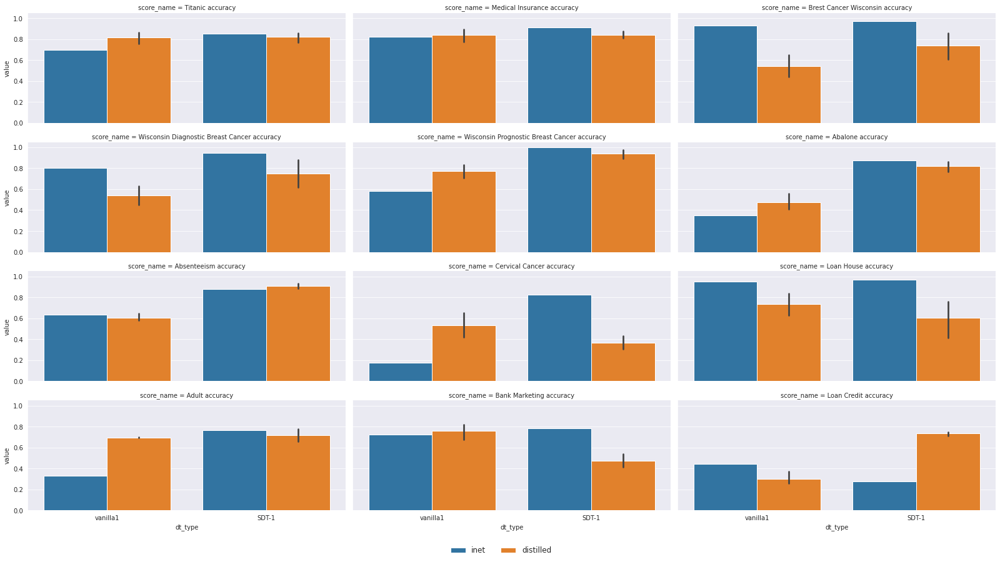

In [18]:
plot = plot_results(data_reduced=real_world_scores_df_distrib_adjusted_plotting, 
                    col = 'score_name', 
                    x = 'dt_type', 
                    y = 'value', 
                    hue = 'technique', 
                    plot_type = sns.barplot, 
                    aspect = 2.5, 
                    col_wrap = 3)

plt.savefig('./evaluation_results/real_workd_complete_by_distrib.pdf', bbox_inches = 'tight', pad_inches = 0)


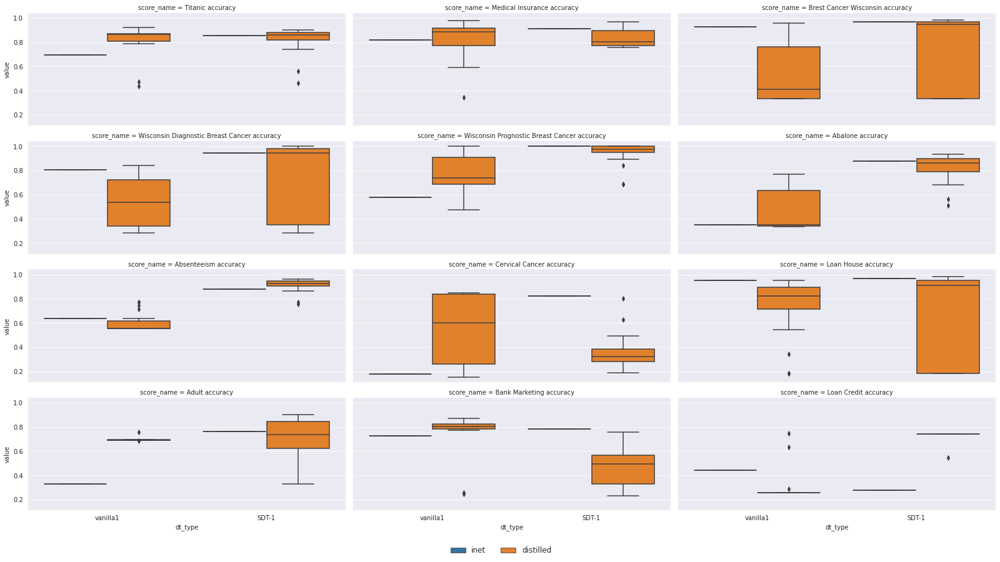

In [19]:
plot = plot_results(data_reduced=real_world_scores_df_distrib_adjusted_plotting, 
                    col = 'score_name', 
                    x = 'dt_type', 
                    y = 'value', 
                    hue = 'technique', 
                    plot_type = sns.boxplot, 
                    aspect = 2.5, 
                    col_wrap = 3)

plt.savefig('./evaluation_results/real_workd_complete_by_distrib.pdf', bbox_inches = 'tight', pad_inches = 0)


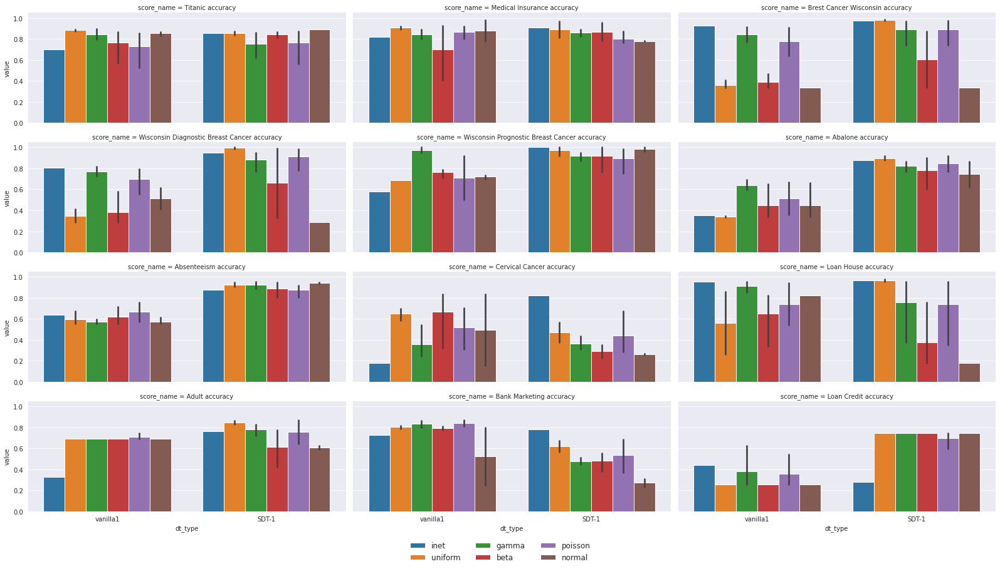

In [20]:
plot = plot_results(data_reduced=real_world_scores_df_distrib_adjusted_plotting, 
                    col = 'score_name', 
                    x = 'dt_type', 
                    y = 'value', 
                    hue = 'distrib', 
                    plot_type = sns.barplot, 
                    aspect = 2.5, 
                    col_wrap = 3)

plt.savefig('./evaluation_results/real_workd_complete_by_distrib.pdf', bbox_inches = 'tight', pad_inches = 0)


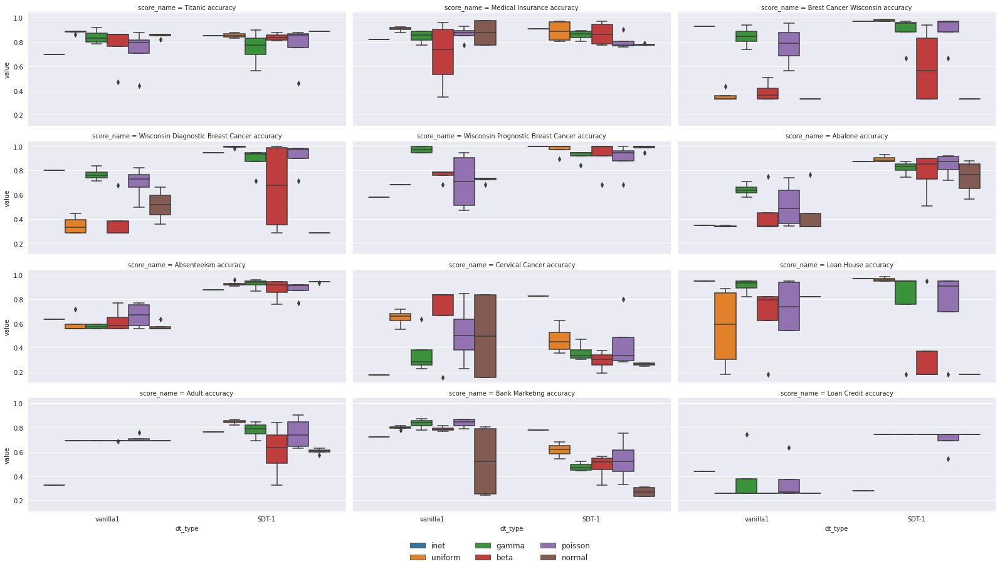

In [21]:
plot = plot_results(data_reduced=real_world_scores_df_distrib_adjusted_plotting, 
                    col = 'score_name', 
                    x = 'dt_type', 
                    y = 'value', 
                    hue = 'distrib', 
                    plot_type = sns.boxplot, 
                    aspect = 2.5, 
                    col_wrap = 3)

plt.savefig('./evaluation_results/real_workd_complete_by_distrib.pdf', bbox_inches = 'tight', pad_inches = 0)
